<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [253]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split, KFold
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import mean_squared_error

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

My superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
We need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components


---

**My goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?


In [254]:
# Load the data
house = pd.read_csv('./housing.csv')
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [255]:
# A:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [256]:
house.shape

(1460, 81)

In [257]:
house.Id.nunique()

1460

In [258]:
house.drop('Id', inplace=True, axis=1)

In [259]:
house.MSZoning.unique()

array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [260]:
# Filtering out any houses that are not residential from the dataset

house = house[house.MSZoning.str.contains('R')]
house.MSZoning.value_counts()

RL    1151
RM     218
RH      16
Name: MSZoning, dtype: int64

In [261]:
house.shape

(1385, 80)

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='MSSubClass', ylabel='Density'>

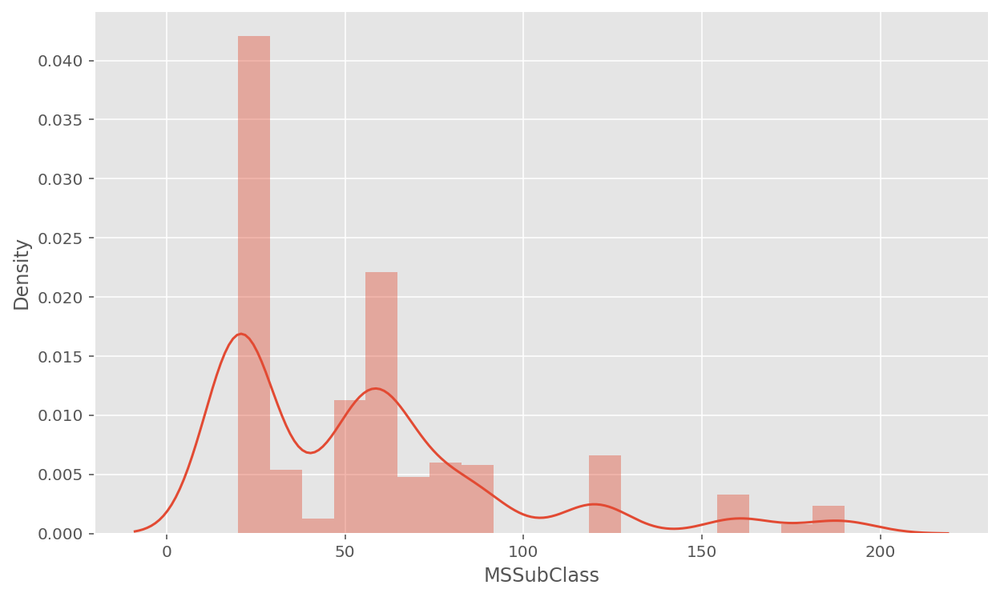

In [262]:
# Plotting the distribution of the type of dwelling involved in the sale

fig = plt.subplots(figsize=(10, 6))
sns.distplot(house.MSSubClass)

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


The mean for Sale Price is 180136.283032491 $
The median for Sale Price is 160000.0 $


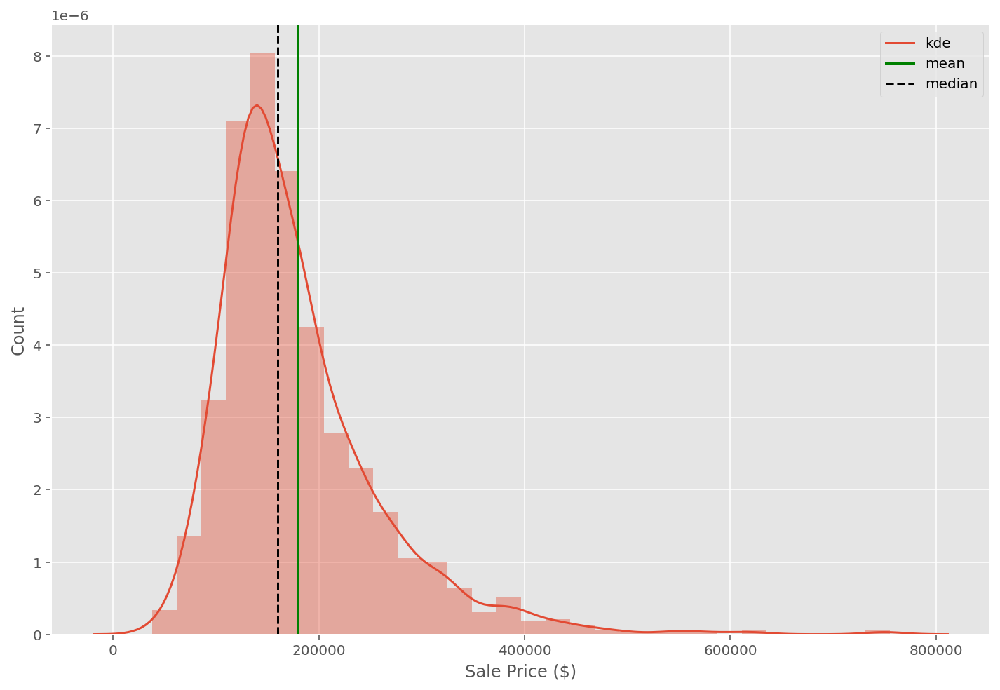

In [263]:
# The distribution of house prices is right-skewed. The mean is higher than median also confirms it.

plt.figure(figsize=(12, 8))

sns.distplot(house.SalePrice, bins=30)

mean=plt.axvline(house.SalePrice.mean(), color='g')
median=plt.axvline(house.SalePrice.median(), color='k', linestyle='--')
plt.xlabel('Sale Price ($)')
plt.ylabel('Count')

plt.legend(['kde', 'mean', 'median'])


print('The mean for Sale Price is', house['SalePrice'].mean(), '$')
print('The median for Sale Price is', house['SalePrice'].median(), '$')

In [264]:
# house.SalePrice.value_counts()
house.SalePrice.nunique()

627

In [2]:
plt.figure(figsize=(16, 8))

sns.boxplot(house.SalePrice, palette="summer")
plt.xlabel('$')
plt.ylabel('Sale Price ', rotation=360);

NameError: name 'plt' is not defined

In [266]:
# We can observe all of the outliers beyond the wiskers on the right

In [267]:
house.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1385.000000,1134.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1380.000000,1385.000000,1385.000000,...,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,55.328520,70.583774,10706.158845,6.063538,5.607942,1970.048375,1984.121300,102.768841,450.666426,49.070036,...,96.589170,43.865704,22.547292,3.594224,15.662094,2.908303,45.400722,6.314079,2007.810830,180136.283032
std,40.883271,24.251032,10185.732173,1.373366,1.125799,29.831024,20.554236,174.373232,459.231291,165.258530,...,126.994291,63.585425,62.067644,30.090182,56.883779,41.246294,509.097441,2.695583,1.326813,79906.363281
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,20.000000,60.000000,7711.000000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129000.000000
50%,50.000000,70.000000,9591.000000,6.000000,5.000000,1971.000000,1992.000000,0.000000,387.000000,0.000000,...,0.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,70.000000,80.000000,11751.000000,7.000000,6.000000,1999.000000,2003.000000,168.000000,719.000000,0.000000,...,169.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,212900.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [268]:
# A mean and median sale price of $180,136 and $160,000 respectively, indicating a positive skew (right skew).
# A sale price range from $37,500 to $755,000.

In [269]:
upper_outlier = house.SalePrice.quantile(0.75) + 1.5 * (house.SalePrice.quantile(0.75) - house.SalePrice.quantile(0.25))
mask = house.SalePrice > upper_outlier 
mask.sum()

print(f"The outliers in Sale Price here are ${int(upper_outlier)} and above, there are {mask.sum()} houses with sales prices considered as outliers")

The outliers in Sale Price here are $338750 and above, there are 61 houses with sales prices considered as outliers


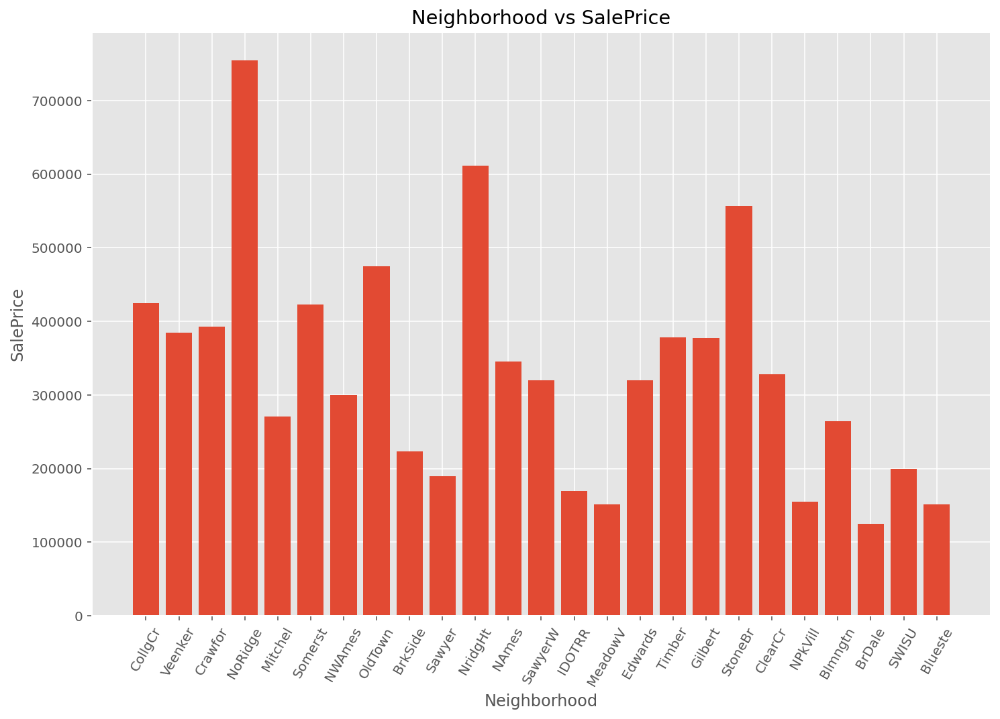

In [270]:
# Distribution of the House prices among all of the Neighborhoods

plt.figure(figsize=(12, 8))

plt.bar(house.Neighborhood, house.SalePrice)
plt.title("Neighborhood vs SalePrice")
plt.xlabel("Neighborhood")
plt.xticks(rotation = 60)
plt.ylabel("SalePrice")
plt.show()

In [271]:
# Number of houses in each neighbourhood 

house.Neighborhood.value_counts().to_frame()

,Neighborhood
NAmes,225
CollgCr,150
OldTown,112
Edwards,100
Gilbert,79
NridgHt,77
Sawyer,74
NWAmes,73
SawyerW,59
BrkSide,58


In [272]:
df_num = house.select_dtypes(include=['int64', 'float64'])
df_num.shape

(1385, 37)

In [273]:
df_num.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000


In [274]:
df_num.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [275]:
df_num.isnull().sum()

MSSubClass         0
LotFrontage      251
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
MasVnrArea         5
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
TotRmsAbvGrd       0
Fireplaces         0
GarageYrBlt       79
GarageCars         0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
3SsnPorch          0
ScreenPorch        0
PoolArea           0
MiscVal            0
MoSold             0
YrSold             0
SalePrice          0
dtype: int64

In [276]:
df_num.LotFrontage.fillna(0, inplace=True)

# df_num.LotFrontage.isnull().sum()

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:4517: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [277]:
df_num.LotFrontage.value_counts()

0.0      251
60.0     137
70.0      70
80.0      69
50.0      54
        ... 
39.0       1
106.0      1
140.0      1
38.0       1
137.0      1
Name: LotFrontage, Length: 111, dtype: int64

In [278]:
df_num.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1380.000000,1385.000000,1385.000000,...,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,55.328520,57.792058,10706.158845,6.063538,5.607942,1970.048375,1984.121300,102.768841,450.666426,49.070036,...,96.589170,43.865704,22.547292,3.594224,15.662094,2.908303,45.400722,6.314079,2007.810830,180136.283032
std,40.883271,34.946347,10185.732173,1.373366,1.125799,29.831024,20.554236,174.373232,459.231291,165.258530,...,126.994291,63.585425,62.067644,30.090182,56.883779,41.246294,509.097441,2.695583,1.326813,79906.363281
min,20.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,20.000000,43.000000,7711.000000,5.000000,5.000000,1953.000000,1966.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129000.000000
50%,50.000000,63.000000,9591.000000,6.000000,5.000000,1971.000000,1992.000000,0.000000,387.000000,0.000000,...,0.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,70.000000,79.000000,11751.000000,7.000000,6.000000,1999.000000,2003.000000,168.000000,719.000000,0.000000,...,169.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,212900.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [279]:
df_num.GarageYrBlt.unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,   nan, 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1935., 1990., 1945., 1987., 1989., 1915.,
       1956., 1948., 1974., 1950., 1961., 1921., 1999., 1979., 2009.,
       1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926., 1955.,
       1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924., 1996.,
       1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925., 1941.,
       2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928., 1922.,
       1934., 1906., 1914., 1946., 1908., 1929., 1933.])

In [280]:
subset_year = df_num[df_num.GarageYrBlt.isna()]
df_num.GarageYrBlt.dropna(inplace=True)

# df_num.GarageYrBlt.unique()

<ipython-input-280-0caaa7080b3c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_num.GarageYrBlt.dropna(inplace=True)


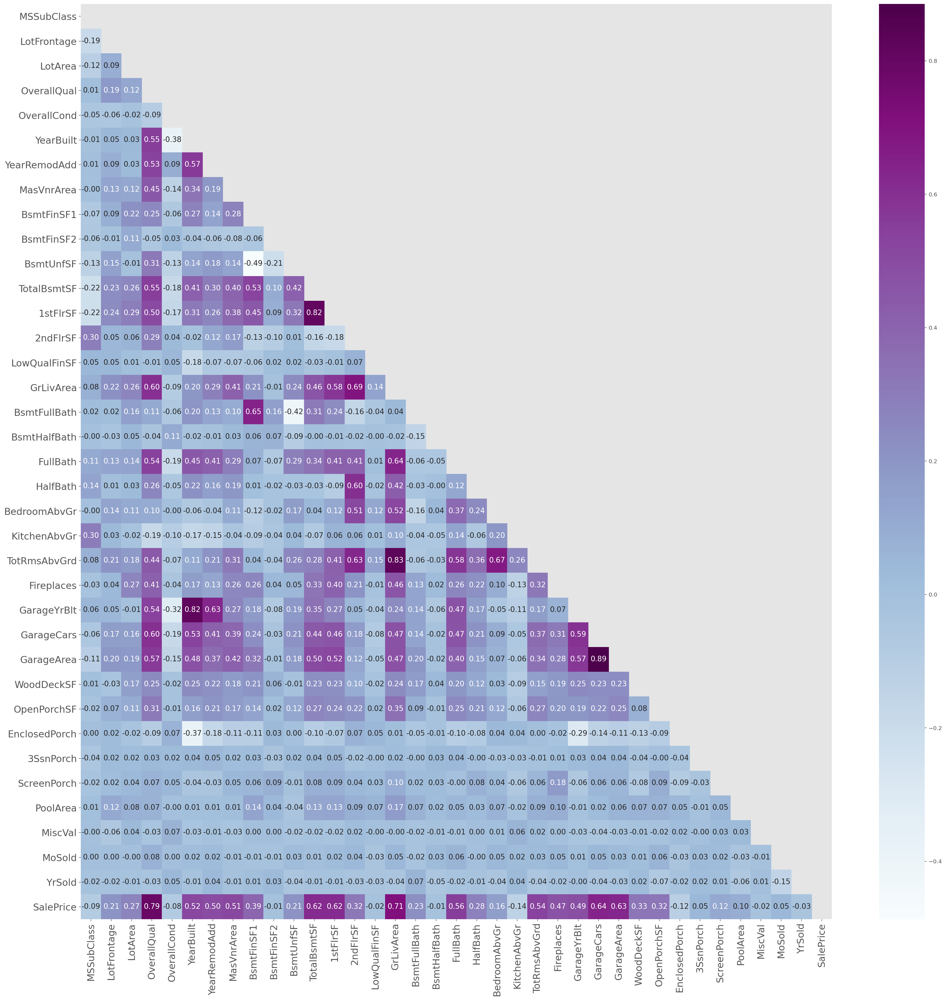

In [281]:
df_corr = df_num.corr()
fig, ax = plt.subplots(figsize=(30, 30))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
sns.heatmap(df_corr, mask=mask, annot=True, cmap= 'BuPu', ax=ax, fmt='.2f', annot_kws={'size':13})
ax.set_ylim([df_num.shape[1], 0])

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=17, rotation=90)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=17)
plt.show()

In [282]:
predictors = ['YearBuilt', 'MasVnrArea', 'TotalBsmtSF', '1stFlrSF', 'TotRmsAbvGrd', 'GrLivArea', 'FullBath', 'GarageCars', 'WoodDeckSF', 'Fireplaces', 'Neighborhood', 'LotShape', 'LotArea', 'Condition1', 'OpenPorchSF', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'GarageType']

In [283]:
predictorss = ['YearBuilt', 'MasVnrArea', 'TotalBsmtSF', '1stFlrSF', 'TotRmsAbvGrd', 'GrLivArea', 'FullBath',
              'GarageCars', 'WoodDeckSF', 'Fireplaces', 'Neighborhood', 'LotShape', 'LotArea', 'Condition1', 
              'OpenPorchSF', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'GarageType', 'SalePrice']

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


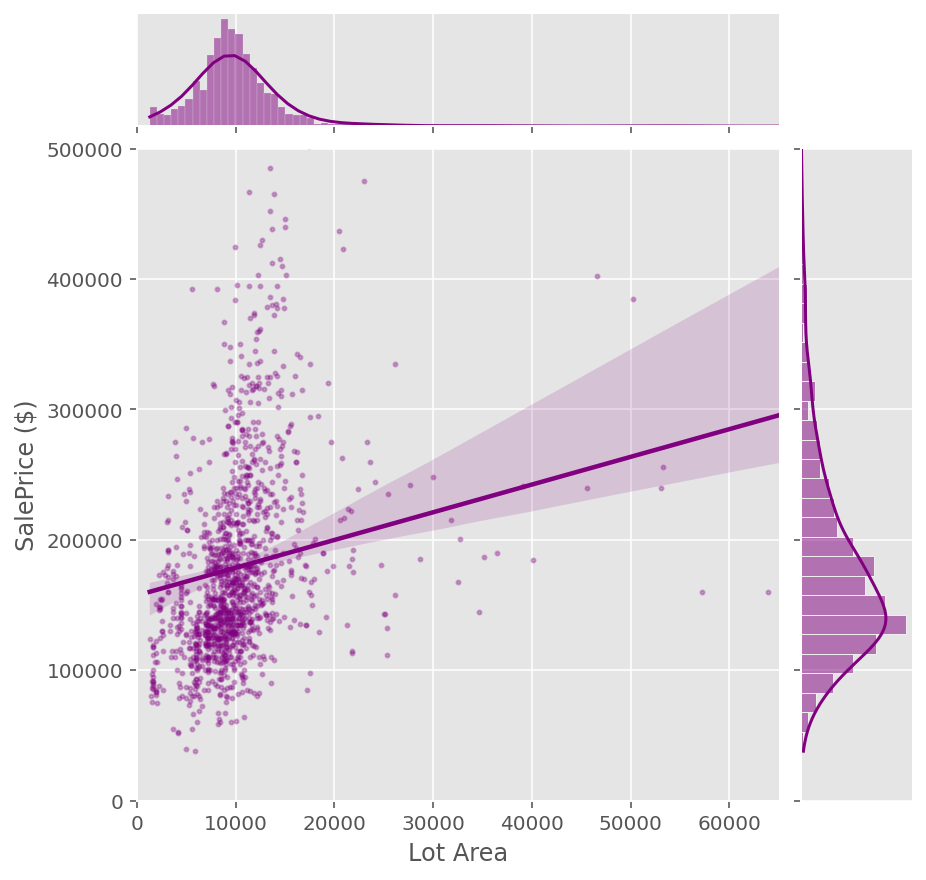

In [284]:
# Checking linear relationship and distibution of some features from the dataset with the Sale Price.

sns.jointplot(house['LotArea'].values, house['SalePrice'].values, height=6, color='purple', kind='reg', scatter_kws={'s':4, 'alpha':0.3}) ;

plt.xlabel('Lot Area')
plt.ylabel('SalePrice ($)')
plt.ylim(0, 500000)                    
plt.xlim(0, 65000);  

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:2015: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


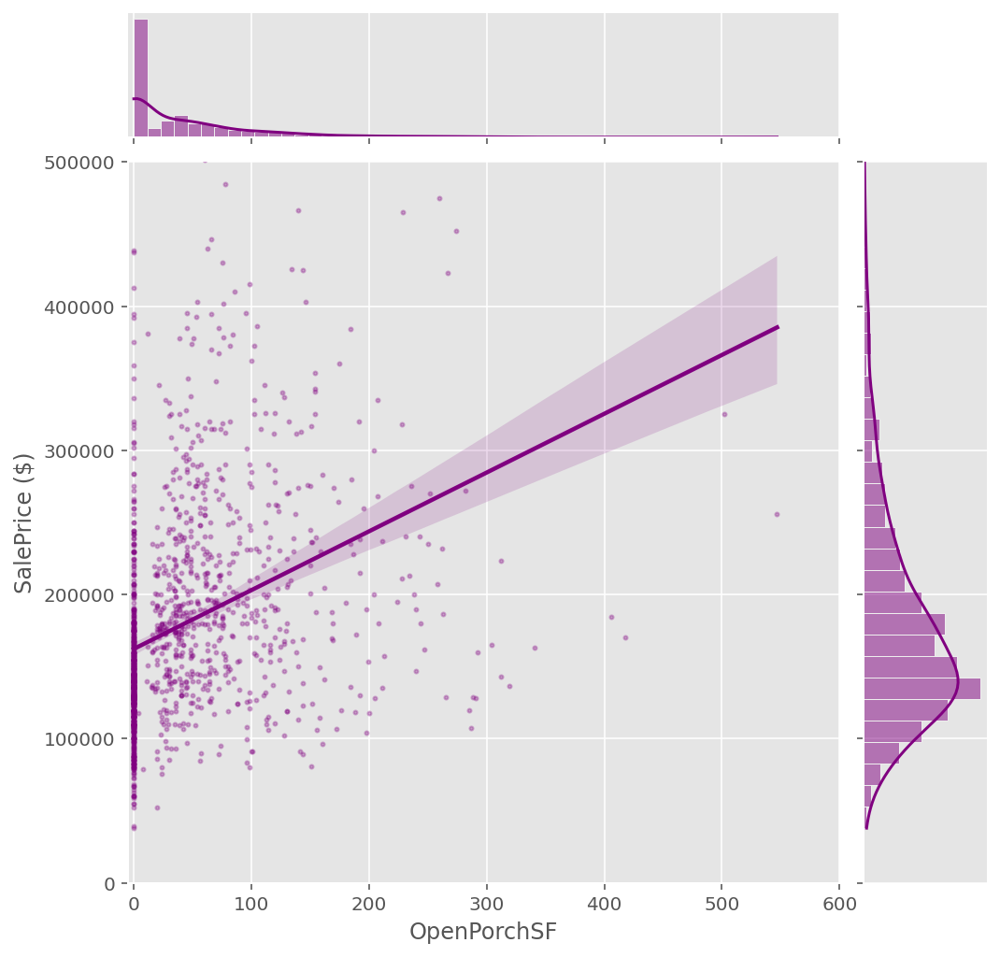

In [285]:
sns.jointplot(house['OpenPorchSF'].values, house['SalePrice'].values, size=7, color='purple', kind='reg', scatter_kws={'s':4, 'alpha':0.3}) ;

plt.xlabel('OpenPorchSF')
plt.xticks()

plt.ylabel('SalePrice ($)')
plt.yticks()
plt.ylim(0, 500000) 
plt.xlim(-5, 600);

In [286]:
# Final choice of what fetures to include for building the first model of the prediction the House price with 
# not_fixed values . Cleaning the nan values on some columns. 

In [287]:
house[['YearBuilt', 'MasVnrArea', 'TotalBsmtSF', '1stFlrSF', 'TotRmsAbvGrd', 'GrLivArea', 
       'FullBath', 'GarageCars', 'WoodDeckSF', 'Fireplaces', 'Neighborhood', 'LotShape', 'LotArea', 
       'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'GarageType']].isnull().sum()


YearBuilt        0
MasVnrArea       5
TotalBsmtSF      0
1stFlrSF         0
TotRmsAbvGrd     0
GrLivArea        0
FullBath         0
GarageCars       0
WoodDeckSF       0
Fireplaces       0
Neighborhood     0
LotShape         0
LotArea          0
Condition1       0
BldgType         0
HouseStyle       0
Foundation       0
BsmtQual        37
GarageType      79
dtype: int64

In [288]:
house.BsmtQual.fillna('NA', inplace=True)
house.GarageType.fillna('NA', inplace=True)

In [289]:
house[house['MasVnrArea'].isnull()]['MasVnrArea']

234    NaN
529    NaN
936    NaN
1243   NaN
1278   NaN
Name: MasVnrArea, dtype: float64

In [290]:
house.drop(house.index[[223,500, 883, 1178, 1211]], inplace=True)

In [291]:
house[house['MasVnrArea'].isnull()]['MasVnrArea']

Series([], Name: MasVnrArea, dtype: float64)

In [292]:
# house = house.reset_index()

In [293]:
# house.apply(lambda x: x.factorize()[0]).corr() # kind='reg'

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

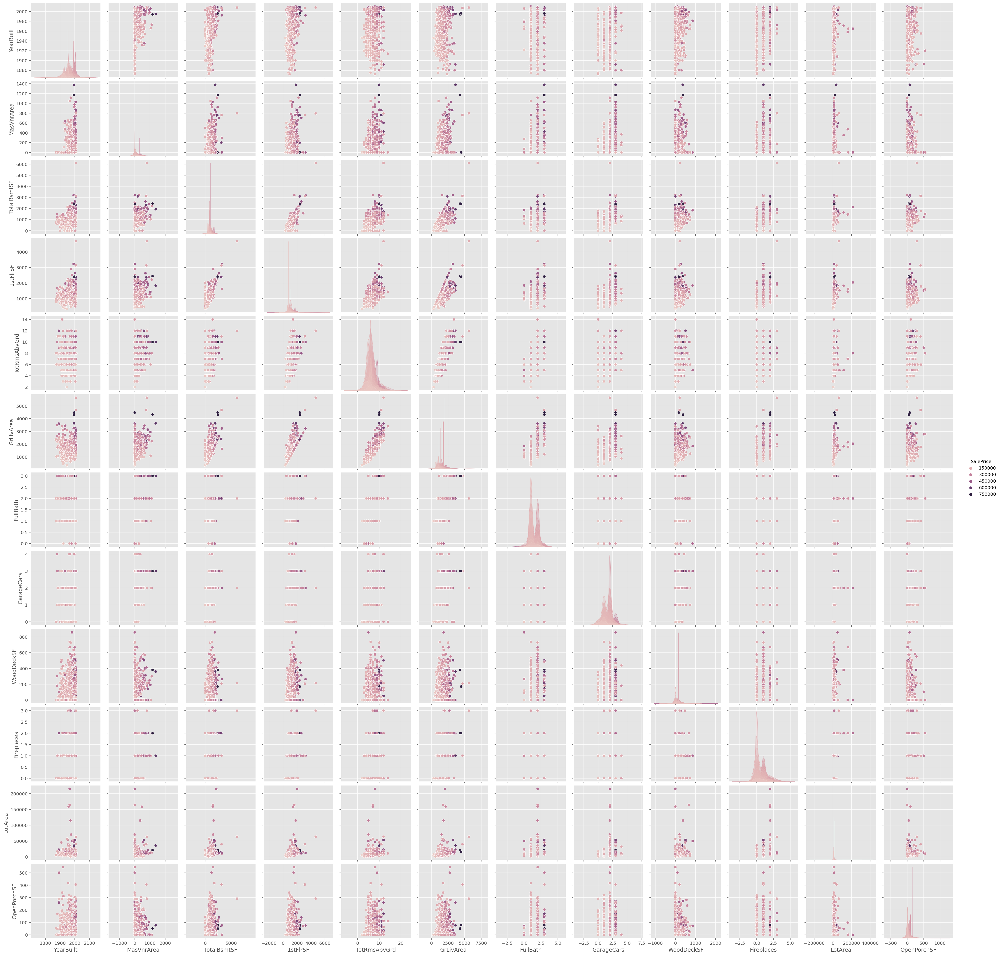

In [294]:
sns.pairplot(house[predictorss], hue='SalePrice');

# We can see that some of the features are categorical, some has good linear regression between each other.
# The highest prices tend to be where with x and y values are the highest as well 
# and lower sale prices are with lower count of x and y values.

In [295]:
# Spliting the data for our model 

print("There are {} homes in the training set.".format((house['YrSold'] < 2010).sum()))
print("There are {} homes in the testing set.".format((house['YrSold'] == 2010).sum()))

y = house['SalePrice']
X = house[predictors]

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)

There are 1217 homes in the training set.
There are 163 homes in the testing set.


In [296]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1380 entries, 0 to 1459
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   YearBuilt     1380 non-null   int64  
 1   MasVnrArea    1380 non-null   float64
 2   TotalBsmtSF   1380 non-null   int64  
 3   1stFlrSF      1380 non-null   int64  
 4   TotRmsAbvGrd  1380 non-null   int64  
 5   GrLivArea     1380 non-null   int64  
 6   FullBath      1380 non-null   int64  
 7   GarageCars    1380 non-null   int64  
 8   WoodDeckSF    1380 non-null   int64  
 9   Fireplaces    1380 non-null   int64  
 10  Neighborhood  1380 non-null   object 
 11  LotShape      1380 non-null   object 
 12  LotArea       1380 non-null   int64  
 13  Condition1    1380 non-null   object 
 14  OpenPorchSF   1380 non-null   int64  
 15  BldgType      1380 non-null   object 
 16  HouseStyle    1380 non-null   object 
 17  Foundation    1380 non-null   object 
 18  BsmtQual      1380 non-null 

In [297]:
# Dumify categorical variables in predictor data, dropping the first value for each field
X_dumified = pd.get_dummies(X, drop_first=True)

# Display head of X_dumified df
X_dumified.head()

,YearBuilt,MasVnrArea,TotalBsmtSF,1stFlrSF,TotRmsAbvGrd,GrLivArea,FullBath,GarageCars,WoodDeckSF,Fireplaces,...,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,2003,196.0,856,856,8,1710,2,2,0,0,...,0,1,0,0,1,0,0,0,0,0
1,1976,0.0,1262,1262,6,1262,2,2,298,1,...,0,1,0,0,1,0,0,0,0,0
2,2001,162.0,920,920,6,1786,2,2,0,1,...,0,1,0,0,1,0,0,0,0,0
3,1915,0.0,756,961,7,1717,1,3,0,1,...,0,0,0,1,0,0,0,0,1,0
4,2000,350.0,1145,1145,9,2198,2,3,192,1,...,0,1,0,0,1,0,0,0,0,0


In [298]:
X_dumified.shape

(1380, 73)

In [299]:
X_train = X_dumified[house['YrSold'] < 2010]  
X_test = X_dumified[house['YrSold'] == 2010]

y_train = y[house['YrSold'] < 2010]
y_test = y[house['YrSold'] == 2010]

In [300]:
print(type(X_train), type(X_test), type(y_train), type(y_test))
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1217, 73) (163, 73) (1217,) (163,)


In [301]:
scaler = StandardScaler()

X_train_std = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_std = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [302]:
# pd.DataFrame(X_train_std, columns=X_dumified.columns).describe()

In [303]:
y_train.describe()

count      1217.000000
mean     180146.757601
std       79454.083727
min       37900.000000
25%      129500.000000
50%      160200.000000
75%      212900.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [304]:
y_test.describe()

count       163.000000
mean     177583.582822
std       81389.189448
min       55000.000000
25%      128100.000000
50%      154300.000000
75%      208000.000000
max      611657.000000
Name: SalePrice, dtype: float64

In [305]:
linreg = LinearRegression()

linreg.fit(X_train_std, y_train)
print(f'R2 score on training data: {linreg.score(X_train_std, y_train)}')
print(f'R2 score on test data: {linreg.score(X_test_std, y_test)}')

R2 score on training data: 0.8348261100577694
R2 score on test data: 0.8549529241265909


In [306]:
np.any(np.isnan(X_train_std))
# np.any(np.isnan(y_train))
# np.all(np.isfinite(X_train_std))
# np.all(np.isfinite(y_train))

False

In [307]:
# y_train[y_train == float('-inf')].sum()

In [308]:
scores = cross_val_score(linreg, X_train_std, y_train, cv=5)
print("Cross-validated scores:", scores)
print("Mean cross-validated training score:", scores.mean())
print(f'model variance = {np.var(scores)}')
print(f'model standard deviation = {np.std(scores)}')

Cross-validated scores: [0.83692944 0.76185374 0.82046887 0.82084921 0.66199996]
Mean cross-validated training score: 0.780420246308488
model variance = 0.00415995238771721
model standard deviation = 0.06449769288677859


In [309]:
linreg.coef_

array([ 8.20493909e+03,  1.71779396e+03,  4.37716500e+03, -6.65609569e+03,
       -3.87288563e+01,  3.73196543e+04,  2.41714801e+03,  1.12188518e+04,
        2.96209966e+03,  6.03918846e+03,  5.16006188e+03,  7.64557808e+02,
       -3.72981233e+02,  4.71770158e+02, -1.24083940e+03, -2.32601182e+03,
       -1.32442518e+03,  3.55398807e+03, -6.80575202e+03, -3.66386522e+03,
       -2.14324431e+03, -2.06135979e+03, -4.85361807e+03, -6.06373340e+03,
        9.93478879e+01, -4.76496270e+03,  8.52832268e+03,  9.26199626e+03,
       -4.97465806e+03, -2.67474569e+03, -4.06741191e+03, -5.73747888e+02,
        1.72121085e+03,  7.89277861e+03, -5.74972775e+02,  3.01665956e+03,
        2.43423423e+03, -3.13321335e+03,  8.01872732e+01, -2.88206267e+03,
        1.37484494e+03,  1.01558013e+03, -7.71678498e+02, -1.68870535e+03,
        6.92972250e+02, -1.73903336e+02,  2.25361883e+02, -1.50596642e+03,
       -4.77416252e+03, -4.80915915e+03, -6.38549232e+03,  1.86802972e+03,
        9.64164839e+03, -

In [310]:
find_lasso_alpha = LassoCV(alphas=np.logspace(-5, 5, 100), cv=5)
find_lasso_alpha.fit(X_train_std, y_train)

print('Best alpha for Lasso is {}'.format(find_lasso_alpha.alpha_))

Best alpha for Lasso is 599.4842503189409


In [311]:
lasso = Lasso(alpha = find_lasso_alpha.alpha_)

lasso.fit(X_train_std, y_train)
print('Lasso Training score:', lasso.score(X_train_std, y_train))
print("Lasso Test Score:", lasso.score(X_test_std, y_test))

Lasso_scores = cross_val_score(lasso, X_train_std, y_train, cv=5)
print("Cross-validated Lasso scores:", Lasso_scores)
print("Mean cross-validated Lasso score:", Lasso_scores.mean())
print(f'Lasso model standard deviation = {np.std(Lasso_scores)}')

Lasso Training score: 0.8278797908283411
Lasso Test Score: 0.8497913519854386
Cross-validated Lasso scores: [0.84903763 0.79251826 0.8186369  0.82964922 0.65965586]
Mean cross-validated Lasso score: 0.7898995748037306
Lasso model standard deviation = 0.06763646984853826


In [312]:
find_ridge_alpha = RidgeCV(alphas=np.logspace(-5, 5, 100), cv=5)
find_ridge_alpha.fit(X_train_std, y_train)

print('Best alpha for Ridge is {}'.format(find_ridge_alpha.alpha_))

Best alpha for Ridge is 29.150530628251758


In [313]:
ridge = Ridge(alpha = find_ridge_alpha.alpha_)

ridge.fit(X_train_std, y_train)
print('Ridge Training score:', ridge.score(X_train_std, y_train))
print("Ridge Test Score:", ridge.score(X_test_std, y_test))

Ridge_scores = cross_val_score(ridge, X_train_std, y_train, cv=5)
print("Cross-validated Ridge scores:", Ridge_scores)
print("Mean cross-validated Ridge score:", Ridge_scores.mean())
print(f'Ridge model standard deviation = {np.std(Ridge_scores)}')


Ridge Training score: 0.8322572326428774
Ridge Test Score: 0.8521186004209227
Cross-validated Ridge scores: [0.84214385 0.79034165 0.81772904 0.82243027 0.65717258]
Mean cross-validated Ridge score: 0.7859634767308242
Ridge model standard deviation = 0.06648514948289466


In [314]:
find_elnet = ElasticNetCV(alphas=np.logspace(-4, 4, 100), l1_ratio=[0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9,
                                                                     0.95, 0.99, 1], cv=5)

find_elnet.fit(X_train_std, y_train)
print('Best alpha for Elastic Net is {}'.format(find_elnet.alpha_))
print('Best l1 ratio for Elastic Net is {}'.format(find_elnet.l1_ratio_))

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1109312683.2597656, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16043545994.557617, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93884006265.61816, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 303968907487.1708, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323241086760.47345, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 338173729100.59607, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 398589752946.98315, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401373061590.8955, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 403361561014.5654, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1372009601.9161377, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3384612441.255005, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6987682112.380493, tolerance: 577878918.4967985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1155043406.0733643, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4320342975.13208, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12188370502.094482, tolerance: 624364106.8228327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1122146011.3947754, tolerance: 663618621.7972406
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1298688299.397705, tolerance: 663618621.7972406
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1462446466.761963, tolerance: 663618621.7972406
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 648094302.6131592, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 863753463.2423096, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1095100168.970459, tolerance: 604892416.2475344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-

Best alpha for Elastic Net is 613.5907273413176
Best l1 ratio for Elastic Net is 1.0


In [315]:
elastic_net = ElasticNet(alpha= find_elnet.alpha_, l1_ratio= find_elnet.l1_ratio_)
elastic_net.fit(X_train_std, y_train)

print('Elastic Net Training score:', elastic_net.score(X_train_std, y_train))
print("Elastic Net Test Score:", elastic_net.score(X_test_std, y_test))

Elastic_scores = cross_val_score(elastic_net, X_train_std, y_train, cv=5)
print("Cross-validated Elastic Net scores:", Elastic_scores)
print("Mean cross-validated Elastic Net score:", Elastic_scores.mean())
print(f'model standard deviation = {np.std(Elastic_scores)}')

Elastic Net Training score: 0.8276537204898089
Elastic Net Test Score: 0.8495849510474506
Cross-validated Elastic Net scores: [0.849101   0.79266955 0.81857875 0.82965642 0.65963451]
Mean cross-validated Elastic Net score: 0.7899280469644456
model standard deviation = 0.067652890716782


The Lasso , Ridge and Elastic Net has similar cross_validated training scores. 
Overall, Elastic Net has the highest cross_validated mean R2 score,
but the Ridge regularization has most highest R2 score on the testing data. 


In [316]:
print('Baseline prediction: ${}'.format(round(np.mean(y_test))))

Baseline prediction: $177584


In [317]:
overall = pd.DataFrame({
    'Lasso': [lasso.score(X_test_std, y_test), np.mean(Lasso_scores), np.std(Lasso_scores)],
    'Ridge': [ridge.score(X_test_std, y_test), np.mean(Ridge_scores), np.std(Ridge_scores)],
    'Elastic Net': [elastic_net.score(X_test_std, y_test), np.mean(Elastic_scores), np.std(Elastic_scores)]
}, index= ['Test Score', 'Mean cross-validated training score', 'Standard deviation of CV training scores'])

overall

,Lasso,Ridge,Elastic Net
Test Score,0.849791,0.852119,0.849585
Mean cross-validated training score,0.789900,0.785963,0.789928
Standard deviation of CV training scores,0.067636,0.066485,0.067653


In [318]:
print('Intercept:', elastic_net.intercept_)
df_coef = pd.DataFrame(list(zip(X_train_std.columns, elastic_net.coef_)), columns=['predictors', 'coefficients']) 

Intercept: 180146.75760065738


In [319]:
df_coef['abs_coef'] = np.abs(elastic_net.coef_)
df_coef

,predictors,coefficients,abs_coef
0,YearBuilt,10738.651672,10738.651672
1,MasVnrArea,2643.671629,2643.671629
2,TotalBsmtSF,5620.581553,5620.581553
3,1stFlrSF,1376.252337,1376.252337
4,TotRmsAbvGrd,0.000000,0.000000
...,...,...,...
68,GarageType_Basment,-0.000000,0.000000
69,GarageType_BuiltIn,0.000000,0.000000
70,GarageType_CarPort,-1336.491234,1336.491234
71,GarageType_Detchd,-463.925636,463.925636


In [320]:
df_coef.sort_values('abs_coef', ascending=False).head(20)

,predictors,coefficients,abs_coef
5,GrLivArea,27749.391961,27749.391961
66,BsmtQual_TA,-18244.697787,18244.697787
64,BsmtQual_Gd,-16728.335213,16728.335213
27,Neighborhood_NridgHt,11900.422876,11900.422876
0,YearBuilt,10738.651672,10738.651672
7,GarageCars,10375.051289,10375.051289
26,Neighborhood_NoRidge,10098.333935,10098.333935
33,Neighborhood_StoneBr,8783.047173,8783.047173
63,BsmtQual_Fa,-6206.825579,6206.825579
65,BsmtQual_NA,-5913.026462,5913.026462


In [321]:
## Calculate the percentage of the variables that have been zeroed-out by the Elastic Net model (Lasso preoritizing)


print(round((df_coef.abs_coef == 0).sum() / len(df_coef) * 100, 2), '%')

24.66 %


In [322]:
# print('Intercept:', ridge.intercept_)
# df = pd.DataFrame(list(zip(X_train_std.columns, ridge.coef_)), columns=['predictors', 'coefficients']) 

In [323]:
# df.sort_values('coefficients', ascending=False).head(30)

In [324]:
coef_elnet = df_coef.sort_values('abs_coef', ascending=False).head(25)

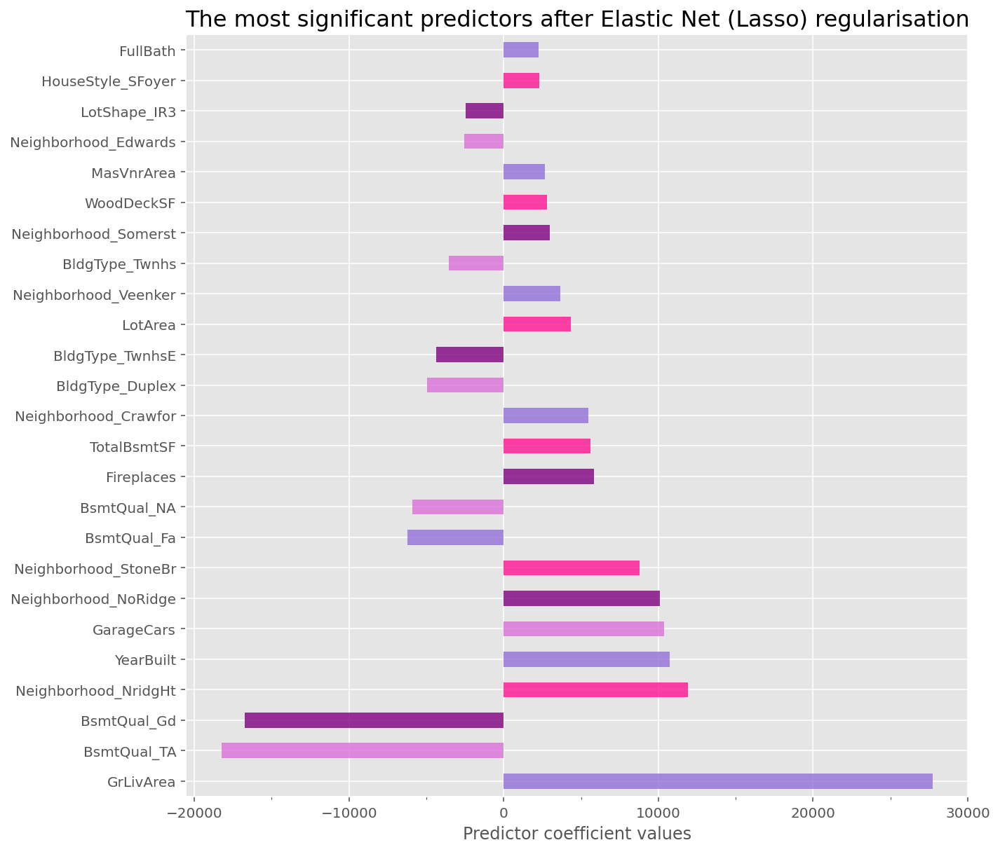

In [325]:
fig, ax = plt.subplots(figsize=(10, 10))

coef_elnet.coefficients.plot(kind='barh', color=['mediumpurple', 'orchid', 'purple', 'deeppink'], ax=ax, alpha = 0.8)
ax.set_yticklabels(coef_elnet.predictors[:25].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_xticks(range(-20000, 30000, 5000), minor=True)
ax.set_title('The most significant predictors after Elastic Net (Lasso) regularisation', fontsize=16)

plt.show()

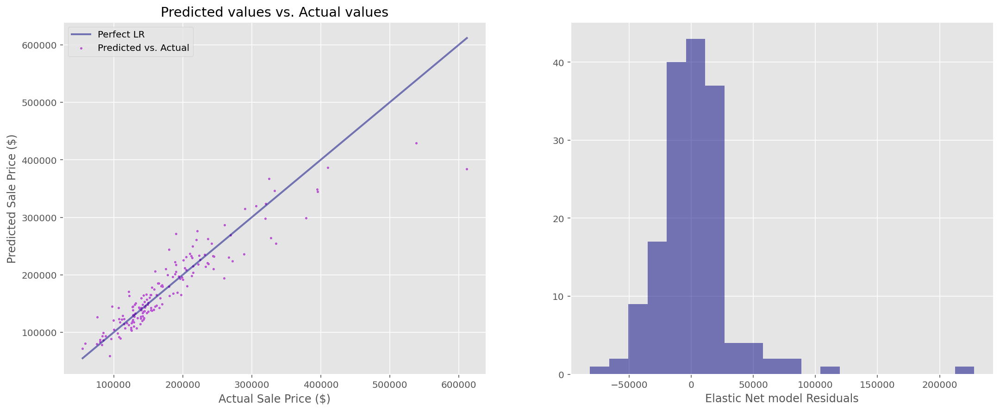

In [326]:
predictions = elastic_net.predict(X_test_std)
fig, ax = plt.subplots(ncols=2, figsize=(18, 7))

ax[0].scatter(y_test, predictions, color='mediumorchid', s=4, label='Predicted vs. Actual')
ax[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='navy', linewidth=2.0, alpha=0.5, label='Perfect LR', )
ax[0].set_xlabel('Actual Sale Price ($)')
ax[0].set_ylabel('Predicted Sale Price ($)')
ax[0].set_title('Predicted values vs. Actual values')
ax[0].legend() 

elnet_residuals = y_test - elastic_net.predict(X_test_std)
ax[1].hist(elnet_residuals, bins= 20, color='navy', alpha= 0.5)
ax[1].set_xlabel('Elastic Net model Residuals')
plt.show()

The model performs really well on the testing set with value of the properties  arount $180K. The scatter plot above shows the predicted values from Elastic Net model versus the actual values, we can see that the model does not predict well the 2 outliers on the right of the actual values. The histogram represent normally distributed residuals of the Elastic Net model.

The Linear Regression has itself very high accuracy of predicting the house price , test set R2 score of 0.8549 and mean CV R2 score of 0.7818.
The Lasso, Ridge and Elastic Net models has slight improvement on mean cv R2 training score. The Elastic Net has highest mean cv R2 score , but because the alpha is 1 , its better to say that Lasso model has more impact . Overall Ridge model has the highest R2 score on testing set ,which is  0.8521. 

The biggest impact on raise in price has the following features: Above grade living area square feet, the year a house was built, size of garage in car capacity, certain Neighbourhoods has big impact, for instance Nridght Neighbourhood would increase the price for $11900 in one unit. The most influence features that decrease the price are Typical, good and fair height of the basement, or no basement in house.


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**My goals:**
1. Evaluate the effect in dollars of the renovatable features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

In [327]:
#  Choosing the renovating features for building the second model.

renovatable_features = ['OverallQual', 'OverallCond', 'Functional', 'Exterior1st', 'Exterior2nd', 'ExterQual', 
                        'ExterCond', 'BsmtCond', 'CentralAir', 'KitchenQual', 'FireplaceQu', 'GarageQual',
                        'GarageCond', 'RoofMatl', 'HeatingQC', 'Electrical', 'BsmtFinType1', 'PoolQC', 'Fence']

In [328]:
house[renovatable_features].shape

(1380, 19)

In [329]:
house[renovatable_features].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1380 entries, 0 to 1459
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   OverallQual   1380 non-null   int64 
 1   OverallCond   1380 non-null   int64 
 2   Functional    1380 non-null   object
 3   Exterior1st   1380 non-null   object
 4   Exterior2nd   1380 non-null   object
 5   ExterQual     1380 non-null   object
 6   ExterCond     1380 non-null   object
 7   BsmtCond      1343 non-null   object
 8   CentralAir    1380 non-null   object
 9   KitchenQual   1380 non-null   object
 10  FireplaceQu   740 non-null    object
 11  GarageQual    1301 non-null   object
 12  GarageCond    1301 non-null   object
 13  RoofMatl      1380 non-null   object
 14  HeatingQC     1380 non-null   object
 15  Electrical    1379 non-null   object
 16  BsmtFinType1  1343 non-null   object
 17  PoolQC        7 non-null      object
 18  Fence         277 non-null    object
dtypes: int

In [330]:
house[renovatable_features].describe(include='all')

# I decided to leave Nan values to make is as new categorical value for model prediction 

,OverallQual,OverallCond,Functional,Exterior1st,Exterior2nd,ExterQual,ExterCond,BsmtCond,CentralAir,KitchenQual,FireplaceQu,GarageQual,GarageCond,RoofMatl,HeatingQC,Electrical,BsmtFinType1,PoolQC,Fence
count,1380.000000,1380.000000,1380,1380,1380,1380,1380,1343,1380,1380,740,1301,1301,1380,1380,1379,1343,7,277
unique,NaN,NaN,7,15,16,4,5,4,2,4,5,5,5,8,5,5,6,3,4
top,NaN,NaN,Typ,VinylSd,VinylSd,TA,TA,TA,Y,TA,Gd,TA,TA,CompShg,Ex,SBrkr,Unf,Gd,MnPrv
freq,NaN,NaN,1281,477,466,893,1205,1238,1291,722,361,1233,1249,1354,677,1258,397,3,155
mean,6.058696,5.611594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,1.370529,1.125167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,5.000000,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,6.000000,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,7.000000,6.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [331]:
# house.BsmtCond.fillna(0, inplace=True)
# house.GarageType.fillna('NA', inplace=True)

In [332]:
house[renovatable_features + ['SalePrice']].corr()

,OverallQual,OverallCond,SalePrice
OverallQual,1.000000,-0.090542,0.789764
OverallCond,-0.090542,1.000000,-0.079462
SalePrice,0.789764,-0.079462,1.000000


In [333]:
q = ['OverallQual', 'OverallCond', 'SalePrice']
# sns.pairplot(house[q], hue='SalePrice');

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/seaborn/dist

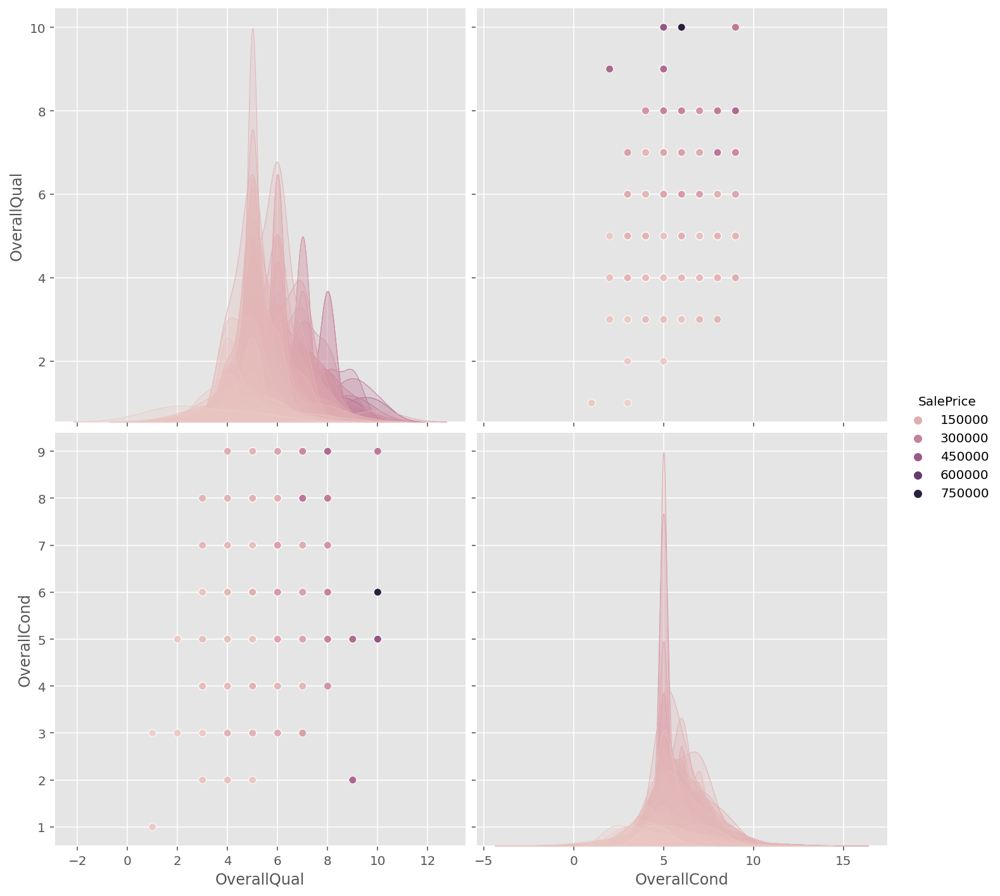

In [334]:
sns.pairplot(house[q], hue='SalePrice', size = 5);
# The higher house price has the better Overall condition and highest overall quality, which makes sence.
# Because there is no missing values, Nan in this case means something like no fence , or no garage.

In [335]:
# Dumify categorical variables in predictor data, including nan as categoty, dropping the first value for each field
X2_dumified = pd.get_dummies(house[renovatable_features], drop_first=True, dummy_na = True)
X2_dumified.head()

,OverallQual,OverallCond,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,Functional_nan,Exterior1st_AsphShn,...,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_nan,PoolQC_Fa,PoolQC_Gd,PoolQC_nan,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_nan
0,7,5,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1
1,6,8,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1
2,7,5,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1
3,7,5,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1
4,8,5,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,1


In [336]:
X2_dumified.shape

(1380, 105)

In [337]:
elnet_residuals_test = y_test - elastic_net.predict(X_test_std)
elnet_residuals_train = y_train - elastic_net.predict(X_train_std)

In [338]:
x_train = X2_dumified[house['YrSold'] < 2010]  
x_test = X2_dumified[house['YrSold'] == 2010]

y_res_train = elnet_residuals_train
y_res_test = elnet_residuals_test

In [339]:
x_train.shape, x_test.shape, y_res_train.shape, y_res_test.shape

((1217, 105), (163, 105), (1217,), (163,))

In [340]:
scale = StandardScaler()

x_train_std = pd.DataFrame(scale.fit_transform(x_train), columns=x_train.columns)
x_test_std = pd.DataFrame(scale.transform(x_test), columns=x_test.columns)

In [341]:
lr = LinearRegression()

lr.fit(x_train_std, y_res_train)
print(f'R2 score on training data: {lr.score(x_train_std, y_res_train)}')
print(f'R2 score on test data: {lr.score(x_test_std, y_res_test)}')

R2 score on training data: 0.38637423098323276
R2 score on test data: -1.6225562879790938e+21


In [342]:
score = cross_val_score(lr, x_train_std, y_res_train, cv=5)
print("Cross-validated scores:", score)
print("Mean cross-validated training score:", score.mean())
print(f'model variance = {np.var(score)}')
print(f'model standard deviation = {np.std(score)}')

Cross-validated scores: [-4.01366442e+22 -8.51607356e+21 -1.79409550e+26 -1.05874939e+24
 -1.09561056e+24]
Mean cross-validated training score: -3.6322512469747886e+25
model variance = 5.1186969906370556e+51
model standard deviation = 7.154506964590261e+25


In [343]:
# lr.coef_

In [344]:
find_lasso_alpha2 = LassoCV(alphas=np.logspace(-5, 5, 100), cv=5)
find_lasso_alpha2.fit(x_train_std, y_res_train)

print('Best alpha for Lasso is {}'.format(find_lasso_alpha2.alpha_))

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404275219.3416748, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 869278137.7575684, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 952037815.4161377, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2479168935.814575, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2479157504.94751, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2479154874.553955, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

Best alpha for Lasso is 954.5484566618328


In [345]:
lasso2 = Lasso(alpha = find_lasso_alpha2.alpha_)

lasso2.fit(x_train_std, y_res_train)
print('Lasso Training score:', lasso2.score(x_train_std, y_res_train))
print("Lasso Test Score:", lasso2.score(x_test_std, y_res_test))

Lasso_score = cross_val_score(lasso2, X_train_std, y_res_train, cv=5)
print("Cross-validated Lasso scores:", Lasso_score)
print("Mean cross-validated Lasso score:", Lasso_score.mean())
print(f'Lasso model standard deviation = {np.std(Lasso_score)}')

Lasso Training score: 0.23131557843144934
Lasso Test Score: 0.13495796124709747
Cross-validated Lasso scores: [-0.0748307  -0.05692992 -0.03984241 -0.05417198 -0.13019908]
Mean cross-validated Lasso score: -0.07119481797943865
Lasso model standard deviation = 0.03153080977929297


In [346]:
find_ridge_alpha2 = RidgeCV(alphas=np.logspace(-5, 5, 100), cv=5)
find_ridge_alpha2.fit(x_train_std, y_res_train)

print('Best alpha for Ridge is {}'.format(find_ridge_alpha2.alpha_))

Best alpha for Ridge is 376.49358067924635


In [347]:
ridge2 = Ridge(alpha = find_ridge_alpha2.alpha_)

ridge2.fit(x_train_std, y_res_train)
print('Ridge Training score:', ridge2.score(x_train_std, y_res_train))
print("Ridge Test Score:", ridge2.score(x_test_std, y_res_test))

Ridge_score = cross_val_score(ridge2, x_train_std, y_res_train, cv=5)
print("Cross-validated Ridge scores:", Ridge_score)
print("Mean cross-validated Ridge score:", Ridge_score.mean())
print(f'Ridge model standard deviation = {np.std(Ridge_score)}')

Ridge Training score: 0.2554370904177816
Ridge Test Score: 0.15065903040770534
Cross-validated Ridge scores: [0.21064834 0.10191087 0.18274336 0.16124784 0.03828026]
Mean cross-validated Ridge score: 0.13896613529490945
Ridge model standard deviation = 0.06174462728525196


In [348]:
find_elnet2 = ElasticNetCV(alphas=np.logspace(-4, 4, 100), l1_ratio=[0.0001, 0.001, 0.01, 0.1, 0.5, 0.7, 0.9,
                                                                     0.95, 0.99, 1], cv=5)

find_elnet2.fit(x_train_std, y_res_train)
print('Best alpha for Elastic Net is {}'.format(find_elnet2.alpha_))
print('Best l1 ratio for Elastic Net is {}'.format(find_elnet2.l1_ratio_))

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2902509603.975342, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129129277375.45337, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 327385100206.4824, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 288295881468.0605, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 286625488583.0065, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 285171608930.0338, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305309330935.49817, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305169451171.7889, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305052576452.84875, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133655400048.79529, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 310397364028.1282, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 316483526485.85675, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 631801302.7044678, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 215463772443.0294, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279115160554.10693, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 312459787145.99774, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 311273923383.5614, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 310246681988.5569, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 345076270590.403, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 344970678341.8204, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 460087874.9954834, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 245582630807.1509, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318556995155.3696, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335571565519.31976, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91354590018.84308, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277194352240.3077, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315749229922.2578, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 344957049324.2118, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5402742454.323853, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139211379891.60944, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 332728671672.0069, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335095797204.5, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 336004506884.93317, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180614385.56848145, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16131493954.17871, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182260248640.6002, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1246076928.1589355, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58762976977.05432, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 218950001372.6969, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4528497984.929565, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53817315183.98169, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108979230097.69061, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 785085847.5706787, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31943859760.449707, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135023581468.00201, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 304433003326.03864, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7710907914.438965, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62606196148.76776, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315340493806.53674, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315734101357.03625, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315942344858.00885, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 381793576.73272705, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10290980135.98291, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41909321985.822815, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 300818464730.4577, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305070980808.038, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306405415000.5691, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 343079684022.6335, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 343081051587.41766, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 343040592921.85364, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315323184967.308, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315329431723.33673, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315334337072.1591, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133018525.40911865, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47999765787.95032, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179092211178.30823, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272095838328.8985, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272098101563.3398, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272099880729.58267, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24794642250.393127, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200110832589.09702, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272273288287.12027, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 303951948602.513, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306111568273.32526, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 307555111336.0554, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301059066115.88477, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301261755376.4871, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301427682397.6457, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14863008814.719238, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170573226108.1514, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241505846339.18015, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 298546694658.716, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 298550598531.32874, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 298553809261.85455, tolerance: 102474262.00819832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220945600.9567871, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20978769632.780273, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169283128383.13467, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/sit

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306093071852.2232, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306119796907.52844, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306141912457.8525, tolerance: 91752387.99485001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46243488343.61517, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99256778836.54462, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134506682700.55917, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221628841300.682, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221680447176.4025, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221723242787.97018, tolerance: 102804102.66211872
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8793443310.447266, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63730319546.98938, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114067332993.65515, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253460579579.0536, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253547555469.3728, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253619688124.07495, tolerance: 118092294.73814823
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/s

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 513921451.6251221, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 594223025.5856934, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 417537807.9633789, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/si

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1545627288.473999, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1545573807.8574219, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1545529418.9788818, tolerance: 114034411.97088248
  model = cd_fast.enet_coordinate_descent_gram(
/Users/Ketevana/opt/anaconda3/lib/python3.8/

Best alpha for Elastic Net is 1072.2672220103254
Best l1 ratio for Elastic Net is 1.0


In [349]:
elastic_net2 = ElasticNet(alpha= find_elnet2.alpha_, l1_ratio= find_elnet2.l1_ratio_)
elastic_net2.fit(x_train_std, y_res_train)

print('Elastic Net Training score:', elastic_net2.score(x_train_std, y_res_train))
print("Elastic Net Test Score:", elastic_net2.score(x_test_std, y_res_test))

Elastic_score = cross_val_score(elastic_net2, x_train_std, y_res_train, cv=5)
print("Cross-validated Elastic Net scores:", Elastic_score)
print("Mean cross-validated Elastic Net score:", Elastic_score.mean())
print(f'model standard deviation = {np.std(Elastic_score)}')

Elastic Net Training score: 0.22327202599133744
Elastic Net Test Score: 0.12618238570774232
Cross-validated Elastic Net scores: [0.25618319 0.12008448 0.19359241 0.14772454 0.0737018 ]
Mean cross-validated Elastic Net score: 0.15825728335350797
model standard deviation = 0.06253924496610351


The Lasso , Ridge and Elastic Net has imporovement on the accuracy of our model compare with linear regression. 
Overall, Elastic Net has the highest mean cross_validated R2 score, but the Ridge regularization has the highest 
R2 score on the testing data.

In [350]:
overall2 = pd.DataFrame({
    'Lasso': [lasso2.score(x_test_std, y_res_test), np.mean(Lasso_score), np.std(Lasso_score)],
    'Ridge': [ridge2.score(x_test_std, y_res_test), np.mean(Ridge_score), np.std(Ridge_score)],
    'Elastic Net': [elastic_net2.score(x_test_std, y_res_test), np.mean(Elastic_score), np.std(Elastic_score)]
}, index= ['Test Score', 'Mean cross-validated training score', 'Standard deviation of CV training scores'])

overall2

,Lasso,Ridge,Elastic Net
Test Score,0.134958,0.150659,0.126182
Mean cross-validated training score,-0.071195,0.138966,0.158257
Standard deviation of CV training scores,0.031531,0.061745,0.062539


In [351]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(lasso2.coef_ == 0)/float(len(lasso2.coef_))) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 74.29%.


In [352]:
print(f'Percent of predictor coefficients zeroed out by Elastic Net regularisation: \
{round((np.sum(elastic_net2.coef_ == 0)/float(len(elastic_net2.coef_))) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Elastic Net regularisation: 77.14%.


In [353]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(ridge2.coef_ == 0)/float(len(ridge2.coef_))) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 10.48%.


In [354]:
print('Intercept:', elastic_net2.intercept_)
df_coef2 = pd.DataFrame(list(zip(x_train_std.columns,elastic_net2.coef_)), columns=['predictors', 'coefficients']) 

df_coef2['abs_coef'] = np.abs(elastic_net2.coef_)

Intercept: 2.3789478953284467e-11


In [355]:
df_coef2.sort_values('abs_coef', ascending=False).head(20)

,predictors,coefficients,abs_coef
1,OverallCond,7565.279797,7565.279797
0,OverallQual,4957.837433,4957.837433
80,RoofMatl_WdShngl,4774.684420,4774.684420
99,PoolQC_Gd,-4500.177205,4500.177205
93,BsmtFinType1_GLQ,2720.149425,2720.149425
96,BsmtFinType1_Unf,-2460.982980,2460.982980
11,Exterior1st_BrkFace,1984.283348,1984.283348
7,Functional_Typ,1938.040243,1938.040243
30,Exterior2nd_ImStucc,1440.074792,1440.074792
62,FireplaceQu_TA,-1227.769936,1227.769936


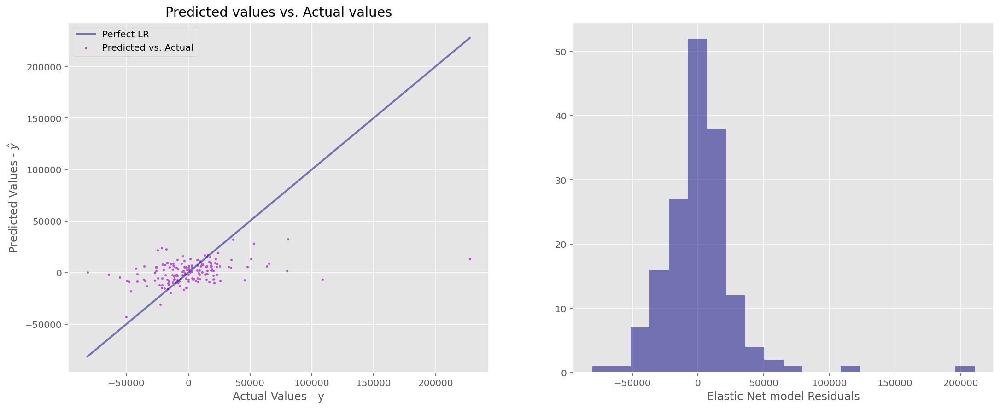

In [356]:
prediction = elastic_net2.predict(x_test_std)
fig, ax = plt.subplots(ncols=2, figsize=(18, 7))

ax[0].scatter(y_res_test, prediction, color='mediumorchid', s=4, label='Predicted vs. Actual')
ax[0].plot([y_res_test.min(), y_res_test.max()], [y_res_test.min(), y_res_test.max()], color='navy', linewidth=2.0, alpha=0.5, label='Perfect LR', )
ax[0].set_xlabel('Actual Values - y')
ax[0].set_ylabel('Predicted Values - $\hat{y}$')
ax[0].set_title('Predicted values vs. Actual values')
ax[0].legend() 

ridge_residuals = y_res_test - ridge2.predict(x_test_std)
ax[1].hist(ridge_residuals, bins= 20, color='navy', alpha= 0.5)
ax[1].set_xlabel('Elastic Net model Residuals')
plt.show()

The model is not good at predicting large values, the residuals of the Elastic Net model normally distributed.

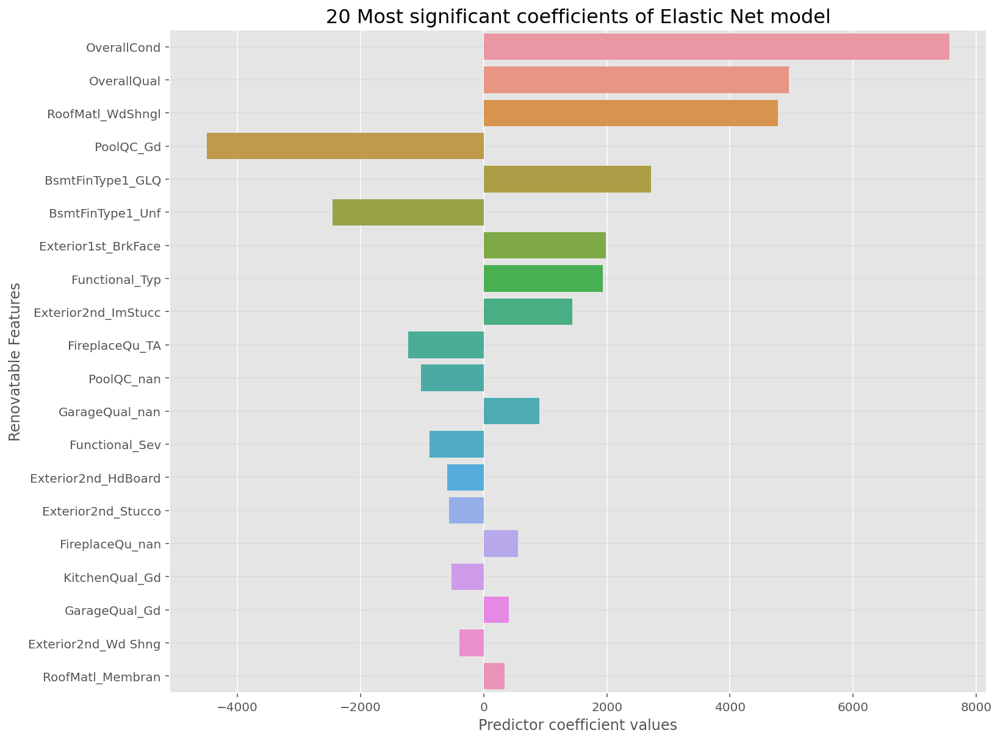

In [358]:
fig, ax = plt.subplots(figsize=(12, 10))

sns.barplot(data = df_coef2.sort_values('abs_coef', ascending=False).head(20), x='coefficients', y ='predictors')
plt.title('20 Most significant coefficients of Elastic Net model', fontsize=16)
ax.yaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)

ax.set_xlabel('Predictor coefficient values')
ax.set_ylabel('Renovatable Features')
plt.show()

The chart above provides further evidence as to why the model's accuracy in predicting the residuals is relatively
poor. It has an accuracy only of 15% on the testing data.
Most important predictors are OverallCond, OverallQual and RoofMatl with Wood Shingles.
The most negative Coefficient has PoolQC with good condition, BsmtFinType1 with unfinished type and Fireplace with average quality. This implies that renovating these features if required could have a positive effect on the overall house price. 


Conclusions 

The sales price can be modelled with much greater accuracy using fixed features, than the residuals 
from this model can be predicted using changeable features!  I would therefore trust my first model as a good
indicator of which properties to buy (based on their fixed features), however I wouldn't trust a model's ability
to accurately identify which properties to renovate and how.

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**My task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests my ability to perform classification analysis in the face of severe class imbalance. I may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [1335]:
# A:
house.SaleCondition.value_counts()

Normal     1152
Partial     102
Abnorml      92
Family       20
Alloca       10
AdjLand       4
Name: SaleCondition, dtype: int64

In [1336]:
# Fraction of the majoraty condition, abnormal sale and the rest 

house.SaleCondition.value_counts(normalize=True)

Normal     0.834783
Partial    0.073913
Abnorml    0.066667
Family     0.014493
Alloca     0.007246
AdjLand    0.002899
Name: SaleCondition, dtype: float64

In [1337]:
# Print baseline accuracy of predicting the majoraty condition

baseline = house.SaleCondition.value_counts(normalize=True).max()

print(f"The baseline accuracy (i.e. probability of predicting the majority class is: \
{round(baseline,2)}")


The baseline accuracy (i.e. probability of predicting the majority class is: 0.83


In [1338]:
# Correction between all of the columns, in this case we are looking at Sale Condition line
house.apply(lambda x: x.factorize()[0]).corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.357871,0.108330,-0.027038,0.016907,0.072310,-0.201204,-0.019376,-0.015740,-0.092582,...,0.016236,0.032199,0.032847,0.012789,0.003328,-0.027830,0.006946,0.003811,-0.019419,-0.063525
MSZoning,0.357871,1.000000,-0.000946,-0.122384,0.008962,0.275493,-0.220541,0.002203,-0.011779,-0.095009,...,-0.027921,-0.029101,-0.017209,-0.014348,0.014223,-0.002886,-0.040577,-0.013531,-0.016362,-0.088635
LotFrontage,0.108330,-0.000946,1.000000,0.164598,-0.019445,-0.028487,0.073513,0.042057,-0.023846,0.000786,...,0.040517,0.044798,-0.065193,-0.085407,-0.063981,0.017564,-0.004697,0.063551,0.091095,0.093000
LotArea,-0.027038,-0.122384,0.164598,1.000000,-0.003926,-0.053528,0.190244,0.075223,0.024008,0.049995,...,0.092961,0.082805,-0.021156,-0.002411,-0.020845,-0.011333,-0.016761,0.008575,-0.030634,0.373939
Street,0.016907,0.008962,-0.019445,-0.003926,1.000000,-0.011312,0.030533,0.066279,-0.001452,0.020764,...,-0.003442,-0.003587,-0.023183,0.044370,0.000390,-0.065212,-0.013359,-0.014454,-0.020061,0.020573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MoSold,-0.027830,-0.002886,0.017564,-0.011333,-0.065212,0.038207,0.023095,-0.010355,0.011844,0.077633,...,0.024314,0.028041,-0.018960,-0.001912,0.009410,1.000000,-0.014681,-0.011290,0.007260,0.015281
YrSold,0.006946,-0.040577,-0.004697,-0.016761,-0.013359,-0.049990,-0.012691,-0.059977,0.024020,0.083499,...,-0.026209,-0.035019,-0.002397,0.051980,0.027620,-0.014681,1.000000,-0.046185,-0.013938,0.041512
SaleType,0.003811,-0.013531,0.063551,0.008575,-0.014454,-0.009600,-0.008344,-0.018007,0.056644,0.007685,...,-0.003596,-0.002058,-0.026047,0.004153,-0.019215,-0.011290,-0.046185,1.000000,0.207512,0.020296
SaleCondition,-0.019419,-0.016362,0.091095,-0.030634,-0.020061,-0.008930,-0.000910,0.070350,0.020844,-0.013647,...,0.088601,0.076913,-0.022408,-0.055803,-0.049254,0.007260,-0.013938,0.207512,1.000000,0.063082


In [1339]:
# Devide data columns on 3 parts to discover correlation of all of the columns with the Sale Condition columns

In [1340]:
l = ['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2' , 'SaleCondition']

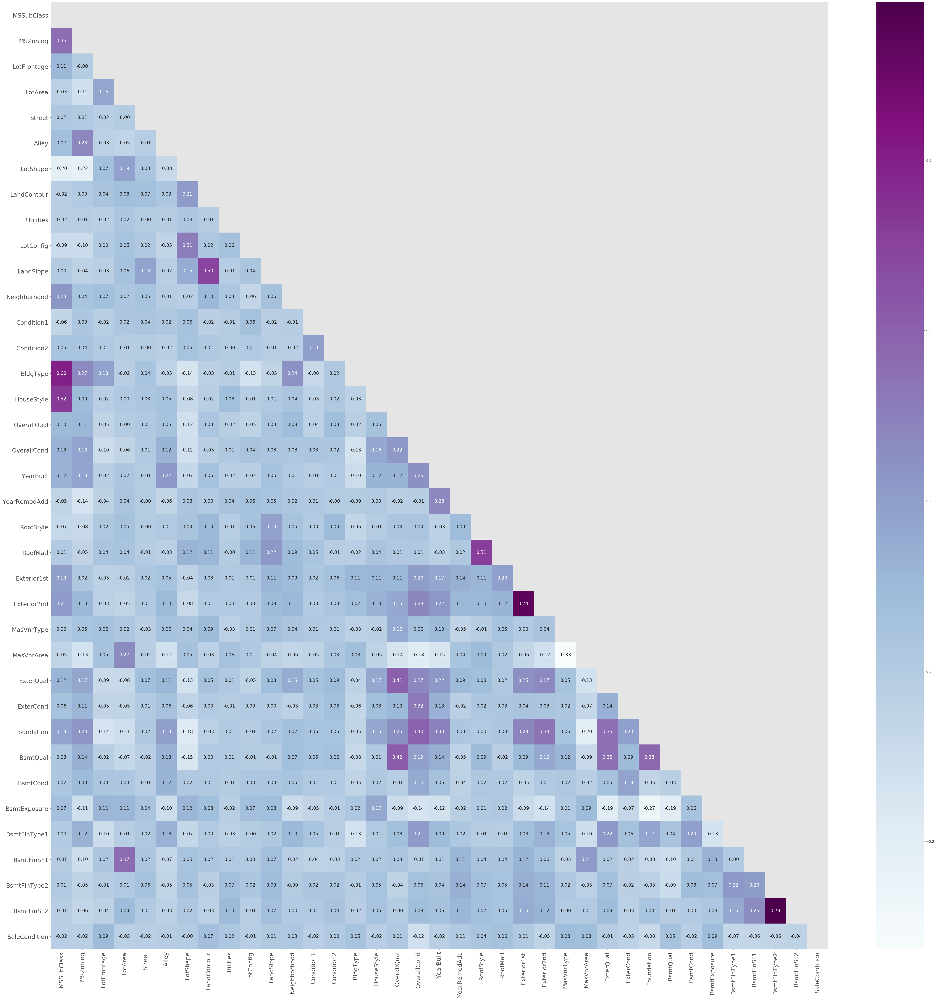

In [1341]:
df_corrr = house[l].apply(lambda x: x.factorize()[0]).corr()
fig, ax = plt.subplots(figsize=(50, 50))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df_corrr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
sns.heatmap(df_corrr, mask=mask, annot=True, cmap= 'BuPu', ax=ax, fmt='.2f', annot_kws={'size':13})
ax.set_ylim([df_num.shape[1], 0])

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=17, rotation=90)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=17)
plt.show()

In [1342]:
L2 = ['BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC',
       'SaleCondition']

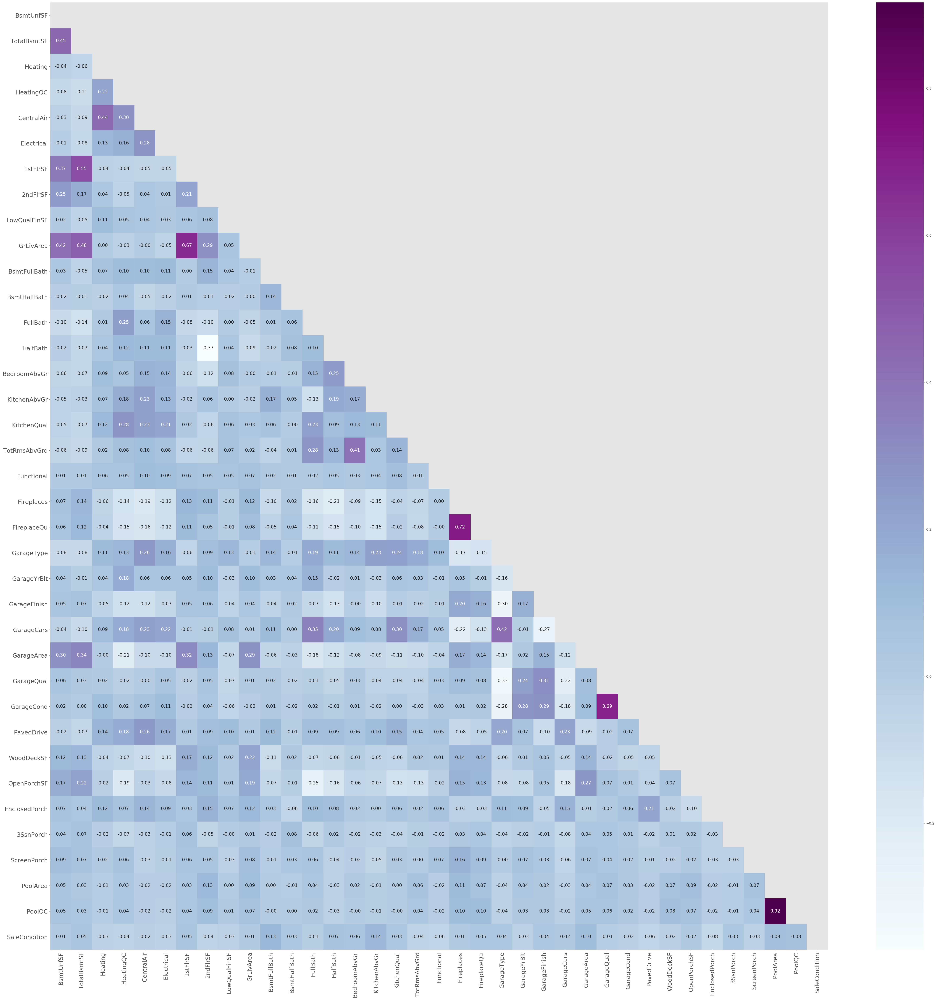

In [1343]:
df_corr2 = house[L2].apply(lambda x: x.factorize()[0]).corr()
fig, ax = plt.subplots(figsize=(50, 50))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(df_corr2, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
sns.heatmap(df_corr2, mask=mask, annot=True, cmap= 'BuPu', ax=ax, fmt='.2f', annot_kws={'size':13})
ax.set_ylim([df_num.shape[1], 0])

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=17, rotation=90)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=17)
plt.show()

In [50]:
L3 = ['Fence', 'MiscFeature', 'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']

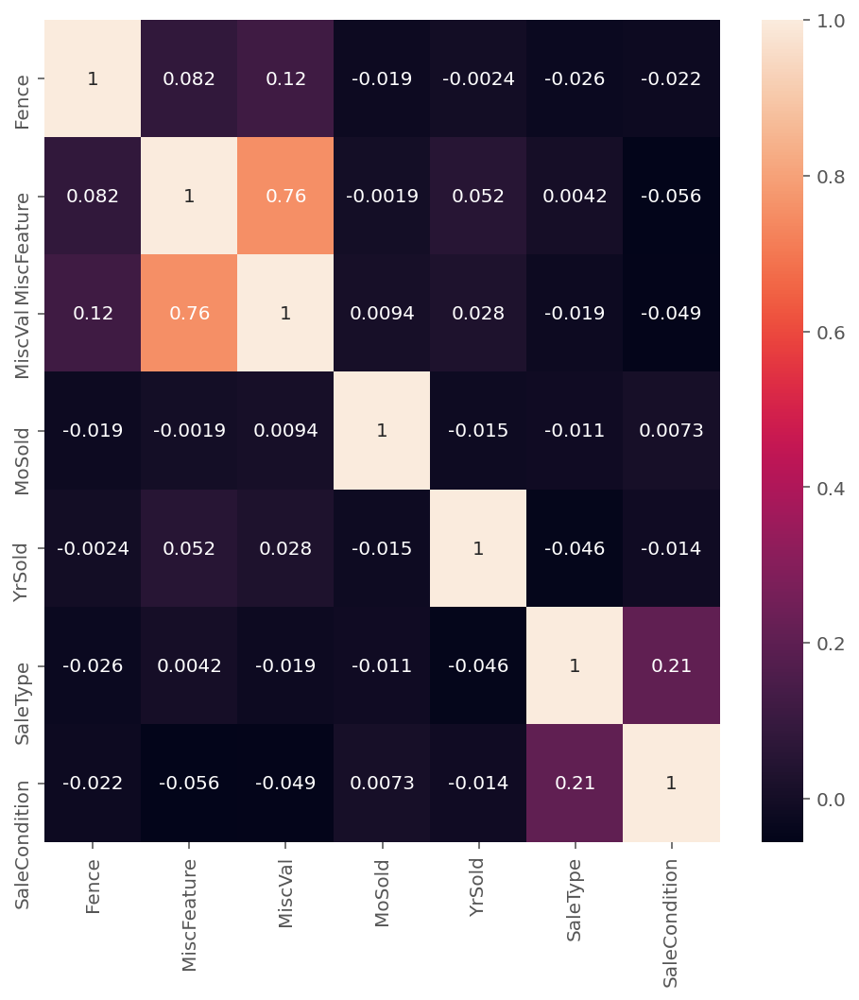

In [51]:
df_corr3 = house[L3].apply(lambda x: x.factorize()[0]).corr()

fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(df_corr3, annot=True, ax=ax)
ax.set_ylim([df_corr3.shape[1], 0])
plt.show()

In [363]:
# Final choice of the features to use for predicting the Sale Condition

features = ['SaleType', 'KitchenAbvGr', 'BsmtFullBath', 'OverallCond']

In [364]:
x = house[features]
y = house['SaleCondition']

In [365]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1380 entries, 0 to 1459
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   SaleType      1380 non-null   object
 1   KitchenAbvGr  1380 non-null   int64 
 2   BsmtFullBath  1380 non-null   int64 
 3   OverallCond   1380 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 53.9+ KB


In [366]:
x_dummy = pd.get_dummies(x, drop_first=True)
x_dummy.head()

,KitchenAbvGr,BsmtFullBath,OverallCond,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD
0,1,1,5,0,0,0,0,0,0,0,1
1,1,0,8,0,0,0,0,0,0,0,1
2,1,1,5,0,0,0,0,0,0,0,1
3,1,1,5,0,0,0,0,0,0,0,1
4,1,1,5,0,0,0,0,0,0,0,1


In [367]:
# Define train and test data sets
x_train = x_dummy[house['YrSold'] < 2010]  
x_test = x_dummy[house['YrSold'] == 2010]

y_train = y[house['YrSold'] < 2010]
y_test = y[house['YrSold'] == 2010]

In [368]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((1217, 11), (163, 11), (1217,), (163,))

In [369]:
y_train.value_counts()

Normal     1006
Partial      96
Abnorml      83
Family       18
Alloca       10
AdjLand       4
Name: SaleCondition, dtype: int64

In [370]:
y_test.value_counts()

Normal     146
Abnorml      9
Partial      6
Family       2
Name: SaleCondition, dtype: int64

In [371]:
sc = StandardScaler()

x_train = sc.fit_transform(x_train) 
x_test = sc.transform(x_test)

In [372]:
# Train a KNN model on the train data and evaluate predictions
from sklearn.neighbors import KNeighborsClassifier

knn3 = KNeighborsClassifier(n_neighbors = 3)
scors = cross_val_score(knn3, x_train, y_train, cv = 6)
print('Scores:', scors)
print('Mean CV R2 score on train data:', np.mean(scors))

Scores: [0.71428571 0.89655172 0.89655172 0.86699507 0.91625616 0.88118812]
Mean CV R2 score on train data: 0.8619714188167585


/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=6.
  warnings.warn(("The least populated class in y has only %d"


In [373]:
# Review values the model is predicting
sale_type_predictions = cross_val_predict(knn3, x_train, y_train, cv=6)
df_predict = pd.DataFrame(sale_type_predictions, columns=['Predictions'])
df_predict['Predictions'].value_counts()

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=6.
  warnings.warn(("The least populated class in y has only %d"


Normal     1034
Partial      92
Abnorml      74
AdjLand      15
Alloca        2
Name: Predictions, dtype: int64

In [374]:
knn3.fit(x_train, y_train)
print('Training score:', knn3.score(x_train, y_train))
print('Test score:',knn3.score(x_test, y_test))

Training score: 0.9022185702547247
Test score: 0.8773006134969326


In [376]:
# pred = knn3.predict(x_train)
# print(classification_report(y_train, pred))

In [166]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, plot_confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

In [167]:
# Performimg the Grid Search on the KNN model 

knn_params = {
    'n_neighbors': [3, 5, 9,10, 13, 14, 15, 16, 17, 20, 25, 30, 40, 50],                 
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']}
knn1 = KNeighborsClassifier()
knn_gridsearch = GridSearchCV(knn1,
                              knn_params,
                              n_jobs=-1, 
                              cv=5, 
                              verbose=1, 
                              return_train_score=True)

knn_gridsearch.fit(x_train, y_train)

Fitting 5 folds for each of 56 candidates, totalling 280 fits


/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 280 out of 280 | elapsed:    8.7s finished


GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 9, 10, 13, 14, 15, 16, 17, 20,
                                         25, 30, 40, 50],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, verbose=1)

In [168]:
knn_gridsearch.best_estimator_

KNeighborsClassifier(metric='manhattan', n_neighbors=13, weights='distance')

In [169]:
best_knn = knn_gridsearch.best_estimator_
print('Best Training score:', best_knn.score(x_train, y_train))
print('Best Test score:',best_knn.score(x_test, y_test))

Best Training score: 0.9202958093672966
Best Test score: 0.9202453987730062


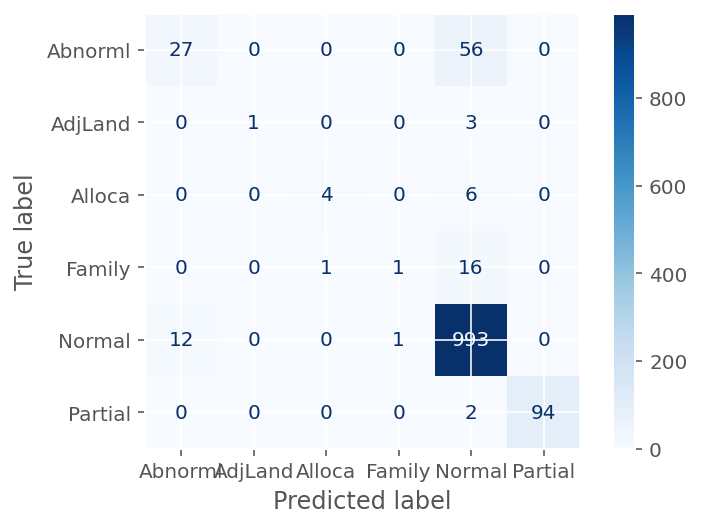

In [176]:
predictions = best_knn.predict(x_train)
plot_confusion_matrix(best_knn, x_train, y_train, cmap='Blues')

In [177]:
predictions2 = best_knn.predict(x_train)

In [178]:
print(classification_report(y_train, predictions2))

              precision    recall  f1-score   support

     Abnorml       0.69      0.33      0.44        83
     AdjLand       1.00      0.25      0.40         4
      Alloca       0.80      0.40      0.53        10
      Family       0.50      0.06      0.10        18
      Normal       0.92      0.99      0.95      1006
     Partial       1.00      0.98      0.99        96

    accuracy                           0.92      1217
   macro avg       0.82      0.50      0.57      1217
weighted avg       0.91      0.92      0.90      1217



In [ ]:
# The grid search Knn model has lots of false negatives, and some false positives values . 
# Low recall and precision scores are confirning it. 

In [184]:
y_train.value_counts()

Normal     1006
Partial      96
Abnorml      83
Family       18
Alloca       10
AdjLand       4
Name: SaleCondition, dtype: int64

In [186]:
# plot_confusion_matrix(best_knn, x_test, y_test, cmap='Blues')

In [188]:
predictions3 = best_knn.predict(x_test)
print(classification_report(y_test, predictions3))

# The performance of this model on test set even worse 

              precision    recall  f1-score   support

     Abnorml       0.40      0.22      0.29         9
      Alloca       0.00      0.00      0.00         0
      Family       0.00      0.00      0.00         2
      Normal       0.94      0.97      0.96       146
     Partial       1.00      1.00      1.00         6

    accuracy                           0.92       163
   macro avg       0.47      0.44      0.45       163
weighted avg       0.90      0.92      0.91       163



/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [209]:
model_lg = LogisticRegression(multi_class='ovr', max_iter=1000)
model_lg.fit(x_train, y_train)

# list(model_lg.get_params().keys())
sc = cross_val_score(model_lg, x_train, y_train, cv=5).mean()
print('Mean cv training score :', sc)
print('Mean cv test score :', cross_val_score(model_lg, x_test, y_test, cv=5).mean())

/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


Mean cv training score : 0.9038588679754435
Mean cv test score : 0.9142045454545453


/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


In [197]:
# create a confusion matrix

predictions = model_lg.predict(x_train)

confusion = confusion_matrix(y_train, predictions)
pd.DataFrame(confusion,
            columns=sorted(y_train.unique()),
            index=sorted(y_train.unique()))

,Abnorml,AdjLand,Alloca,Family,Normal,Partial
Abnorml,22,0,0,0,61,0
AdjLand,0,0,0,0,4,0
Alloca,0,0,0,0,10,0
Family,0,0,0,0,18,0
Normal,16,0,0,0,990,0
Partial,0,0,0,0,3,93


In [199]:
print(classification_report(y_train, predictions))

# same here, some of the classes was even zeroed-out .

              precision    recall  f1-score   support

     Abnorml       0.58      0.27      0.36        83
     AdjLand       0.00      0.00      0.00         4
      Alloca       0.00      0.00      0.00        10
      Family       0.00      0.00      0.00        18
      Normal       0.91      0.98      0.95      1006
     Partial       1.00      0.97      0.98        96

    accuracy                           0.91      1217
   macro avg       0.42      0.37      0.38      1217
weighted avg       0.87      0.91      0.88      1217



/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [200]:
# Applying th egrid seach on Logistic Regression model

lg_params = {'penalty': ['elasticnet'],
             'l1_ratio':[0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 0.99, 1],
             'solver': ['saga'],
             'C': np.logspace(-5, 5, 5)}

In [201]:
lr_gridsearch = GridSearchCV(model_lg,
                             lg_params,
                             n_jobs=-1, 
                             cv=5, 
                             verbose=1)

In [202]:
lr_gridsearch.fit(x_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:   30.6s finished


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000, multi_class='ovr'),
             n_jobs=-1,
             param_grid={'C': array([1.00000000e-05, 3.16227766e-03, 1.00000000e+00, 3.16227766e+02,
       1.00000000e+05]),
                         'l1_ratio': [0.001, 0.01, 0.1, 0.5, 0.7, 0.9, 0.99, 1],
                         'penalty': ['elasticnet'], 'solver': ['saga']},
             verbose=1)

In [210]:
# print out the best parameters
lr_gridsearch.best_params_

{'C': 0.0031622776601683794,
 'l1_ratio': 0.001,
 'penalty': 'elasticnet',
 'solver': 'saga'}

In [211]:
# print out the best mean cross-validated score
lr_gridsearch.best_score_

0.903865614248128

In [212]:
lr_gridsearch.best_score_

0.903865614248128

In [213]:
# score your model on your testing data
lr_gridsearch.score(x_test, y_test)

0.9325153374233128

In [219]:
# assign your best estimator to the variable 'best_logreg'
best_lg = lr_gridsearch.best_estimator_

In [220]:
# use your train data to create your classification report
predicts = best_lg.predict(x_train)
print(classification_report(y_train, predicts))

              precision    recall  f1-score   support

     Abnorml       1.00      0.04      0.07        83
     AdjLand       0.00      0.00      0.00         4
      Alloca       0.00      0.00      0.00        10
      Family       0.00      0.00      0.00        18
      Normal       0.90      1.00      0.95      1006
     Partial       1.00      0.97      0.98        96

    accuracy                           0.91      1217
   macro avg       0.48      0.33      0.33      1217
weighted avg       0.89      0.91      0.86      1217



/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [221]:
# use your test data to create your classification report
predicts1 = best_lg.predict(x_test)
print(classification_report(y_test, predicts1))

              precision    recall  f1-score   support

     Abnorml       0.00      0.00      0.00         9
      Family       0.00      0.00      0.00         2
      Normal       0.93      1.00      0.96       146
     Partial       1.00      1.00      1.00         6

    accuracy                           0.93       163
   macro avg       0.48      0.50      0.49       163
weighted avg       0.87      0.93      0.90       163



/Users/Ketevana/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [223]:
# confusion_train = confusion_matrix(y_train, predicts)
# pd.DataFrame(confusion_train,
#             columns=sorted(y_train.unique()),
#             index=sorted(y_train.unique()))

,Abnorml,AdjLand,Alloca,Family,Normal,Partial
Abnorml,3,0,0,0,80,0
AdjLand,0,0,0,0,4,0
Alloca,0,0,0,0,10,0
Family,0,0,0,0,18,0
Normal,0,0,0,0,1006,0
Partial,0,0,0,0,3,93


Text(0.5, 1.0, 'evaluation of Test set')

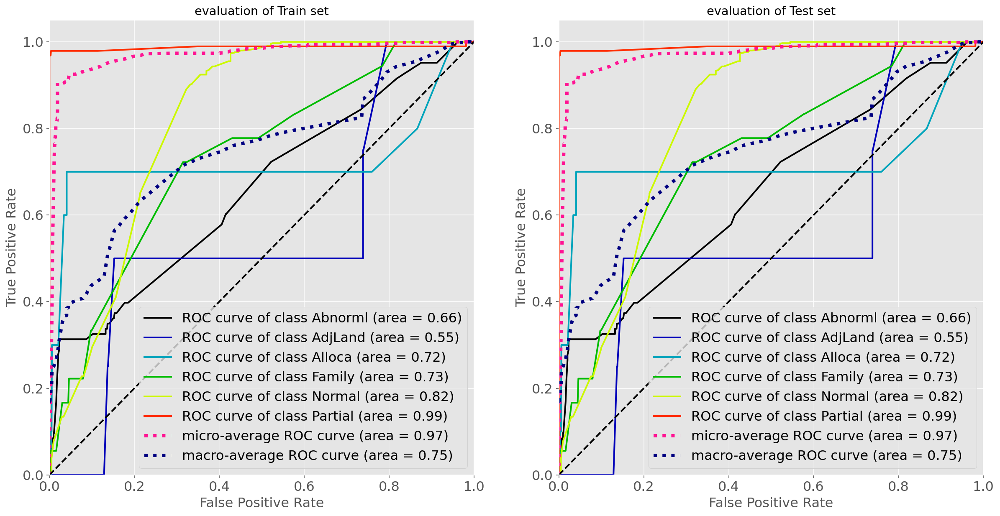

In [226]:
import scikitplot as skplt
from matplotlib.colors import ListedColormap

probs1 = best_lg.predict_proba(x_train)
probs2 = best_lg.predict_proba(x_train)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
skplt.metrics.plot_roc(y_train, probs1, plot_micro=True, plot_macro=True, title_fontsize= 20, 
                       text_fontsize=16, figsize=(12 ,10), ax = ax1)
skplt.metrics.plot_roc(y_train, probs2, plot_micro=True, plot_macro=True, title_fontsize= 20, 
                       text_fontsize=16, figsize=(12 ,10), ax = ax2)
ax1.set_title('evaluation of Train set')
ax2.set_title('evaluation of Test set')

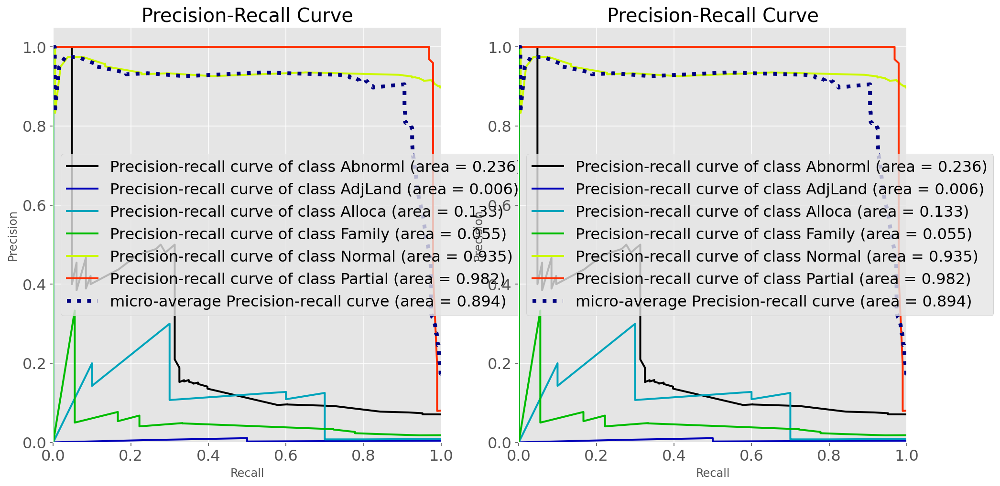

In [229]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols= 2, figsize=(16,8))
skplt.metrics.plot_precision_recall(y_train, probs1, 
                       plot_micro=True, title_fontsize=20, text_fontsize=16, ax=ax1)
skplt.metrics.plot_precision_recall(y_train, probs2, plot_micro = True,
                                   title_fontsize=20, text_fontsize=16, ax=ax2)

plt.show()

Conclusions 

We can observe on the graphs, confusion matrices and classification reports above that we got the highest accuracy
scores using the Grid search for Knn and Logistic Regression models, but its only good for predicting the main class
(Normal sale condition) that has the majority distribution . It much prevails in number of observation than any other 
class in our Sale Condition Category. So it doesnt perform well on predicting the rest of the classes in it.

Overall, I can say that the first model using the KNN predicitons with 3 neighborhs gave me the best result of
predicting all of the classes in Sale Condition . If the Sale Condition Training the model with a lower number 
of neighbours increased the variance of the model and hence resulted in a better distribution of predicted 
sales conditions across the different types, but the model wasn’t performing much better than the baseline, 
it has impovement on 3% in mean CV score. 